In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from os.path import join
import scanpy as sc
import ast
import anndata
import seaborn as sns
import gc
import pickle
from pathlib import Path
from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache
import warnings

import matplotlib.font_manager as fm

# Load coorelation matrix results

In [8]:
save_path = '/mnt/Y/Lab/Stereo_seq_data/RL_BG_data/analysis_results/cell_type_mapping_binary_genes_20251005.pkl'
with open(save_path, 'rb') as f:
    save_dict = pickle.load(f)
save_dict.keys()

dict_keys(['corr_mat', 'wmb_stype_expr', 'hmba_group_expr', 'hmba_cluster_markers', 'hs_mm_homologs', 'marker_wmb_bg_adata', 'marker_hmba_bg_adata'])

In [9]:
corr_mat = save_dict['corr_mat']
wmb_stype_expr = save_dict['wmb_stype_expr']
hmba_group_expr = save_dict['hmba_group_expr']
hmba_cluster_markers = save_dict['hmba_cluster_markers']
hs_mm_homologs = save_dict['hs_mm_homologs']
marker_wmb_bg_adata = save_dict['marker_wmb_bg_adata']
marker_hmba_bg_adata = save_dict['marker_hmba_bg_adata']

In [10]:
hmba_group_expr

,IL17RD,GALNT3,TPH2,NTS,CST3,CORT,RXFP2,SCIN,PDGFRB,ADAMTS9,...,SNTG2,HTR2A,RERGL,SEMA5B,CLMP,SPATA22,RASGRP1,MCAM,SYTL4,GFAP
AMY-SLEA-BNST D1 GABA,-0.069474,0.161671,0.384037,3.947394,-0.391351,0.132320,-0.052738,-0.468296,-0.247127,-0.289167,...,-0.300826,1.157614,-0.109824,-0.006002,0.072251,-0.218962,0.642523,-0.205078,-0.215727,-0.263295
AMY-SLEA-BNST GABA,0.308740,0.214302,0.097794,0.938281,-0.330847,0.001973,0.069378,-0.439278,-0.267624,-0.244646,...,-0.075590,0.344171,-0.076656,-0.249634,0.009513,-0.226682,0.054795,-0.170787,-0.210403,-0.215746
Astrocyte,0.480904,0.131901,-0.081118,-0.072257,1.415110,-0.164398,-0.160791,-0.492144,1.314342,1.187380,...,-0.496293,-0.063754,0.136036,-0.289201,-0.129461,-0.051235,-0.658753,-0.220177,1.491052,1.737959
B cells,-0.196584,0.603499,-0.112696,-0.101256,-0.245974,-0.135831,-0.170908,-0.438674,-0.296826,-0.243632,...,-0.410679,-0.299873,-0.107892,-0.347899,-0.151300,-0.349498,-0.227380,-0.226566,-0.317970,-0.205905
BAM,-0.162431,-0.245180,-0.080878,-0.088039,0.167607,-0.192220,-0.163304,0.121456,-0.279843,-0.304113,...,-0.510747,-0.281190,-0.132194,-0.404454,-0.149973,-0.330841,-0.763295,-0.254598,-0.291954,-0.293650
BF SKOR1 Glut,0.214194,0.431367,0.596231,-0.039895,-0.195167,-0.049216,-0.116756,-0.234535,-0.253149,-0.278284,...,0.155464,2.116768,0.030737,0.112728,0.452377,-0.183954,-0.296743,0.030635,-0.090099,-0.246032
COP,0.122599,-0.140369,-0.050520,-0.090456,-0.300601,-0.105459,-0.138912,-0.480464,-0.170132,-0.248360,...,-0.484355,-0.283860,0.021844,2.690345,-0.178940,-0.257175,-0.680873,0.279953,-0.123052,-0.285154
Endo,1.014528,-0.237067,-0.073906,-0.047848,0.224784,-0.175339,-0.167156,-0.462819,-0.185914,1.543379,...,-0.075403,-0.261719,0.128204,-0.403402,-0.220872,-0.322586,-0.748716,0.087217,0.284703,-0.142429
Ependymal,0.267980,1.561445,-0.017991,2.663712,0.826794,-0.111620,-0.161008,0.901591,-0.122940,0.868118,...,1.076826,-0.156006,0.382464,0.274007,-0.132647,0.006987,-0.646799,-0.237334,0.092389,1.002595
GPe MEIS2-SOX6 GABA,0.087927,0.228674,0.080366,-0.052132,-0.258828,-0.038395,-0.148183,-0.460531,-0.238043,-0.170454,...,0.339846,0.366576,0.057260,1.666315,1.665406,-0.238596,-0.640597,-0.102849,1.405924,-0.215477


In [11]:
# reorder the rows, to make a diagnal sorting
max_cols = np.argmax(corr_mat, axis=1)
row_orders = np.argsort(max_cols)
row_orders

array([17, 39, 45, 44, 42, 18, 10, 11, 56, 40, 43,  9, 46, 14, 37, 24, 47,
       48, 52, 54, 51, 49, 50, 38, 53, 22, 21, 41,  0,  1, 34, 30, 35, 12,
       33, 59, 32, 36,  5, 58, 31, 29, 13,  2, 15,  8, 23,  6, 25, 16, 26,
       57, 27, 28,  7,  3, 19, 20,  4, 55])

In [12]:
hs_start_idx = np.where(hmba_group_expr.index[row_orders] == 'OT D1 ICj')[0].item()
hs_end_idx = np.where(hmba_group_expr.index[row_orders] == 'STRv D1 NUDAP MSN')[0].item()

mm_start_idx = np.where(wmb_stype_expr.index == '0262 OT D3 Folh1 Gaba_1')[0].item()
mm_end_idx = np.where(wmb_stype_expr.index == '0289 STR-PAL Chst9 Gaba_5')[0].item()

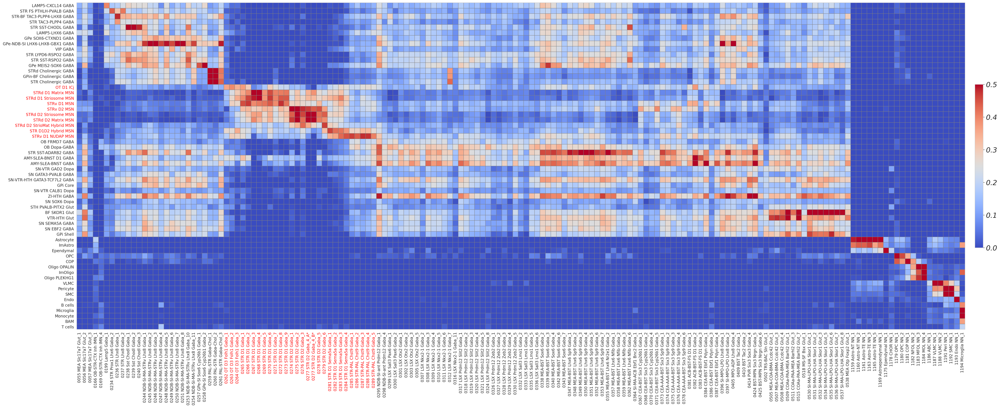

In [13]:
fig, ax = plt.subplots(figsize=(45,15), dpi=200)

# plot
im = ax.imshow(corr_mat[row_orders, :], cmap='coolwarm', vmin=0, vmax=0.5)

# colorbar
cbar = plt.colorbar(im, fraction=0.05, shrink=0.5, pad=0.01)

# import matplotlib.font_manager as fm
helv = fm.FontProperties(family='sans-serif', style='oblique', size=18, weight=500)
# helv = fm.FontProperties(family='sans-serif', size=20, weight=500)
for tick in cbar.ax.get_yticklabels():
    tick.set_fontproperties(helv)

# ticks and tick labels
ax.set_xticks(range(corr_mat.shape[1]))
ax.set_xticklabels(wmb_stype_expr.index, rotation=90)

# set drd ticklabels color
for i, label in enumerate(ax.get_xticklabels()):
    if (i >= mm_start_idx) and (i <= mm_end_idx):
        label.set_color('red')
        # label.set_fontweight('bold')

ax.set_yticks(range(corr_mat.shape[0]))
ax.set_yticklabels(hmba_group_expr.index[row_orders])

# set drd ticklabels color
for i, label in enumerate(ax.get_yticklabels()):
    if (i >= hs_start_idx) and (i <= hs_end_idx):
        label.set_color('red')
        # label.set_fontweight('bold')

# cancel ticklines
ax.tick_params(axis='both', grid_alpha=0)

# column border lines
num_cols = corr_mat.shape[1]
col_edges = np.arange(-0.5, num_cols, 1)
for x in col_edges:
    # antializased: remove surrounding extra white areas
    ax.axvline(x, color="gray", linewidth=0.1, antialiased=False)

# row border lines
num_rows = corr_mat.shape[0]
row_edges = np.arange(-0.5, num_rows, 1)
for y in row_edges:
    # antializased: remove surrounding extra white areas
    ax.axhline(y, color="gray", linewidth=0.1, antialiased=False)


save_dir = '/mnt/Y/Lab/Stereo_seq_data/RL_BG_data/analysis_results/panels/cell_type_mapping'
plt.show()

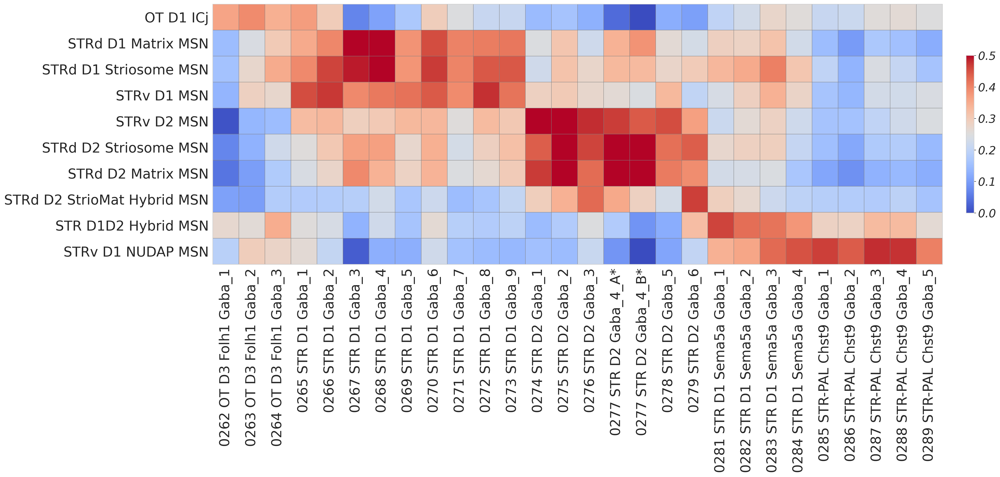

In [14]:
# plot DRD sub-region
fig, ax = plt.subplots(figsize=(25,10), dpi=250)

# plot
im = ax.imshow(corr_mat[row_orders, :][hs_start_idx: hs_end_idx+1, mm_start_idx: mm_end_idx+1], cmap='coolwarm', vmin=0, vmax=0.5)

# colorbar
cbar = plt.colorbar(im, fraction=0.05, shrink=0.5, pad=0.03)

# import matplotlib.font_manager as fm
helv = fm.FontProperties(family='sans-serif', style='oblique', size=20, weight=500)
for tick in cbar.ax.get_yticklabels():
    tick.set_fontproperties(helv)

n_cols = mm_end_idx - mm_start_idx + 1
n_rows = hs_end_idx - hs_start_idx + 1

# ticks and tick labels
ax.set_xticks(range(n_cols))
ax.set_xticklabels(wmb_stype_expr.index[mm_start_idx: mm_end_idx+1], rotation=90, fontsize=24)

ax.set_yticks(range(n_rows))
ax.set_yticklabels(hmba_group_expr.index[row_orders][hs_start_idx: hs_end_idx+1], fontsize=24)

# cancel ticklines
ax.tick_params(axis='both', grid_alpha=0)

# column border lines
col_edges = np.arange(-0.5, n_cols, 1)
for x in col_edges:
    # antializased: remove surrounding extra white areas
    ax.axvline(x, color="gray", linewidth=0.1, antialiased=False)

# row border lines
row_edges = np.arange(-0.5, n_rows, 1)
for y in row_edges:
    # antializased: remove surrounding extra white areas
    ax.axhline(y, color="gray", linewidth=0.1, antialiased=False)

save_dir = '/mnt/Y/Lab/Stereo_seq_data/RL_BG_data/analysis_results/panels/cell_type_mapping'
plt.show()

# Load HMBA group markers

In [15]:
data_path = '/mnt/X/Lab/Bereket_public/Human_basal_ganglion_project/Human_Basal_ganglia_Gene_Probe_design/HumanGenomeTranscriptome/BG_gene_list_from_Allen/HMBA_Human_BG_annotation_allen.csv'
cl_markers = pd.read_csv(data_path, index_col='cluster')
cl_markers

,Neighborhood,Class,Subclass,Group,cluster_size,NSF_marker_count,NSForest_markers,binary_genes,donor_composition,donor_composition_alert_0.90,...,cluster_median_level1.class_scANVI_AIT11.6_round1_entropy,cluster_median_level2.neighborhood_scANVI_AIT11.6_round1_entropy,cluster_median_level1.class_scANVI_AIT11.6_round2_entropy,cluster_median_level2.neighborhood_scANVI_AIT11.6_round2_entropy,cluster_median_level3.subclass_scANVI_AIT11.6_round2_entropy,cluster_median_doublet_score,cluster_median_pct_counts_mt,gene_counts,umi_counts,umi_gene_ratio
cluster,,,,,,,,,,,,,,,,,,,,,
IN_1,Subpallium GABA,CN MGE GABA,SN STH GABA,SN STH GABA,95,4.0,"['SST', 'RMST', 'GRIK1', 'TCF7L2']","['SST', 'RMST', 'AC108169.1', 'GRIK1', 'HMGCS1...",H20.30.002(0.9474)| H23.30.001(0.0316)| H20.30...,Cautious,...,0,0.64,0.0,0.5,0.5,0.0267,0.4436,3298,6619,2.01
IN_2,Glut Sero Dopa,F M Glut,BG Glut,SN STH VTA Glut,167,2.0,"['SHOX2', 'LHX9']","['SHOX2', 'SHOX', 'LHX9', 'AC016766.1', 'LHX2'...",H20.30.002(0.9521)| H19.30.004(0.0299)| H23.30...,Cautious,...,0,0,0.0,0,0,0.16,0.4314,9155,50906,5.56
IN_3,Glut Sero Dopa,F M Glut,BG Glut,SN STH VTA Glut,112,2.0,"['LINC02347', 'SIM1']","['DAPL1', 'LINC02196', 'LINC02347', 'SIM1', 'C...",H23.30.001(0.625)| H20.30.002(0.3036)| H19.30....,Balanced,...,0,0,0.0,0,0,0.09,0.2447,6828.5,25948,3.8
IN_4,Glut Sero Dopa,F M Glut,BG Glut,SN STH VTA Glut,130,3.0,"['AL158154.3', 'AL356488.2', 'SLC26A3']","['AL158154.3', 'AL356488.2', 'C5orf63', 'SLC26...",H23.30.001(0.9308)| H20.30.002(0.0462)| H19.30...,Cautious,...,0,0,0.0,0.12,0.12,0.084,0.6749,4958,12160.5,2.45
IN_6,Subpallium GABA,CN MGE GABA,STR Cholinergic GABA,STR Cholinergic GABA,97,2.0,"['HDC', 'PPP1R1C']","['HDC', 'MIR3663HG', 'SLC18A2', 'QRFPR', 'RSPO...",H23.30.001(0.8969)| H19.30.004(0.1031)| H18.30...,Balanced,...,0,0,0.0,0,0,0.16,0.0732,6919,25134,3.63
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NN_80,Nonneuron,Astro-Epen,Astrocyte,STR Astrocyte,340,6.0,"['OSGIN2', 'AL137139.2', 'ETNPPL', 'SLC14A1', ...","['OSGIN2', 'AL137139.2', 'ETNPPL', 'SLC14A1', ...",H20.30.001(0.3118)| H23.30.001(0.2971)| H18.30...,Balanced,...,0,0,0.0,0,0,0,0.063,2989.5,7326,2.45
NN_81,Nonneuron,Astro-Epen,Astrocyte,STR Astrocyte,1648,2.0,"['CLCF1', 'IL1R1']","['CLCF1', 'CHI3L1', 'EMP1', 'SDS', 'IL1R1', 'L...",H20.30.001(0.9654)| H23.30.001(0.0194)| H20.30...,Cautious,...,0,0,0.0,0,0,0.02,0.0711,3043.5,9077.5,2.98
NN_82,Nonneuron,Astro-Epen,Astrocyte,BN Astrocyte,644,3.0,"['EGLN3', 'AC114971.1', 'PLSCR4']","['RANBP3L', 'COLEC12', 'EGLN3', 'AC114971.1', ...",H20.30.001(0.455)| H23.30.001(0.278)| H20.30.0...,Balanced,...,0,0,0.0,0,0,0.02,0.0297,3008,7976,2.65


In [16]:
# convert columns NSForest_markers, binary_genes
def safe_literal_eval(x):
    if pd.isna(x):
        return np.nan
    return ast.literal_eval(x)

cl_markers['NSForest_markers_list'] = cl_markers['NSForest_markers'].apply(safe_literal_eval)
cl_markers['binary_genes_list'] = cl_markers['binary_genes'].apply(safe_literal_eval)
cl_markers

,Neighborhood,Class,Subclass,Group,cluster_size,NSF_marker_count,NSForest_markers,binary_genes,donor_composition,donor_composition_alert_0.90,...,cluster_median_level1.class_scANVI_AIT11.6_round2_entropy,cluster_median_level2.neighborhood_scANVI_AIT11.6_round2_entropy,cluster_median_level3.subclass_scANVI_AIT11.6_round2_entropy,cluster_median_doublet_score,cluster_median_pct_counts_mt,gene_counts,umi_counts,umi_gene_ratio,NSForest_markers_list,binary_genes_list
cluster,,,,,,,,,,,,,,,,,,,,,
IN_1,Subpallium GABA,CN MGE GABA,SN STH GABA,SN STH GABA,95,4.0,"['SST', 'RMST', 'GRIK1', 'TCF7L2']","['SST', 'RMST', 'AC108169.1', 'GRIK1', 'HMGCS1...",H20.30.002(0.9474)| H23.30.001(0.0316)| H20.30...,Cautious,...,0.0,0.5,0.5,0.0267,0.4436,3298,6619,2.01,"[SST, RMST, GRIK1, TCF7L2]","[SST, RMST, AC108169.1, GRIK1, HMGCS1, TCF7L2,..."
IN_2,Glut Sero Dopa,F M Glut,BG Glut,SN STH VTA Glut,167,2.0,"['SHOX2', 'LHX9']","['SHOX2', 'SHOX', 'LHX9', 'AC016766.1', 'LHX2'...",H20.30.002(0.9521)| H19.30.004(0.0299)| H23.30...,Cautious,...,0.0,0,0,0.16,0.4314,9155,50906,5.56,"[SHOX2, LHX9]","[SHOX2, SHOX, LHX9, AC016766.1, LHX2, ADCYAP1,..."
IN_3,Glut Sero Dopa,F M Glut,BG Glut,SN STH VTA Glut,112,2.0,"['LINC02347', 'SIM1']","['DAPL1', 'LINC02196', 'LINC02347', 'SIM1', 'C...",H23.30.001(0.625)| H20.30.002(0.3036)| H19.30....,Balanced,...,0.0,0,0,0.09,0.2447,6828.5,25948,3.8,"[LINC02347, SIM1]","[DAPL1, LINC02196, LINC02347, SIM1, CPNE9, ADC..."
IN_4,Glut Sero Dopa,F M Glut,BG Glut,SN STH VTA Glut,130,3.0,"['AL158154.3', 'AL356488.2', 'SLC26A3']","['AL158154.3', 'AL356488.2', 'C5orf63', 'SLC26...",H23.30.001(0.9308)| H20.30.002(0.0462)| H19.30...,Cautious,...,0.0,0.12,0.12,0.084,0.6749,4958,12160.5,2.45,"[AL158154.3, AL356488.2, SLC26A3]","[AL158154.3, AL356488.2, C5orf63, SLC26A3, LIN..."
IN_6,Subpallium GABA,CN MGE GABA,STR Cholinergic GABA,STR Cholinergic GABA,97,2.0,"['HDC', 'PPP1R1C']","['HDC', 'MIR3663HG', 'SLC18A2', 'QRFPR', 'RSPO...",H23.30.001(0.8969)| H19.30.004(0.1031)| H18.30...,Balanced,...,0.0,0,0,0.16,0.0732,6919,25134,3.63,"[HDC, PPP1R1C]","[HDC, MIR3663HG, SLC18A2, QRFPR, RSPO2, PPP1R1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NN_80,Nonneuron,Astro-Epen,Astrocyte,STR Astrocyte,340,6.0,"['OSGIN2', 'AL137139.2', 'ETNPPL', 'SLC14A1', ...","['OSGIN2', 'AL137139.2', 'ETNPPL', 'SLC14A1', ...",H20.30.001(0.3118)| H23.30.001(0.2971)| H18.30...,Balanced,...,0.0,0,0,0,0.063,2989.5,7326,2.45,"[OSGIN2, AL137139.2, ETNPPL, SLC14A1, ALDH1A1,...","[OSGIN2, AL137139.2, ETNPPL, SLC14A1, ALDH1A1,..."
NN_81,Nonneuron,Astro-Epen,Astrocyte,STR Astrocyte,1648,2.0,"['CLCF1', 'IL1R1']","['CLCF1', 'CHI3L1', 'EMP1', 'SDS', 'IL1R1', 'L...",H20.30.001(0.9654)| H23.30.001(0.0194)| H20.30...,Cautious,...,0.0,0,0,0.02,0.0711,3043.5,9077.5,2.98,"[CLCF1, IL1R1]","[CLCF1, CHI3L1, EMP1, SDS, IL1R1, LDLR, OAF, F..."
NN_82,Nonneuron,Astro-Epen,Astrocyte,BN Astrocyte,644,3.0,"['EGLN3', 'AC114971.1', 'PLSCR4']","['RANBP3L', 'COLEC12', 'EGLN3', 'AC114971.1', ...",H20.30.001(0.455)| H23.30.001(0.278)| H20.30.0...,Balanced,...,0.0,0,0,0.02,0.0297,3008,7976,2.65,"[EGLN3, AC114971.1, PLSCR4]","[RANBP3L, COLEC12, EGLN3, AC114971.1, PLSCR4, ..."


In [17]:
part_cl_markers = cl_markers[['Group', 'binary_genes_list']].copy()
group_markers = part_cl_markers.groupby('Group').sum()
print(len(group_markers))
group_markers.head()

51


,binary_genes_list
Group,
BAM,"[CCDC26, LINC01684, MS4A4E, SIGLEC1, MRC1, CD1..."
BG SKOR1 Glut,"[KCNJ5, AC117453.1, EMX2OS, RSPO3, TBR1, AC022..."
BN Astrocyte,"[STK32A, LINC01088, EDNRB, TNC, APOE, SLC6A11,..."
BN LAMP5 CXCL14 GABA,"[ROR2, CRH, AC132803.1, EYA4, KIT, NRIP3, EPHA..."
BN LAMP5 LHX6 GABA,"[LINC01344, ADGRG6, AL136456.1, CA3, EYA4, ITG..."


# Fine-map Drd MSN cell types

### List cell types

In [18]:
np.sort(group_markers.index)

array(['BAM', 'BG SKOR1 Glut', 'BN Astrocyte', 'BN LAMP5 CXCL14 GABA',
       'BN LAMP5 LHX6 GABA', 'BN MEIS2 GABA', 'COP', 'Endo', 'Ependymal',
       'GP MEIS2 SOX6 GABA', 'GP SOX6 KCNA1 GABA', 'GPi Core',
       'GPi Shell', 'ImOligo', 'Microglia', 'NDB SI LHX6 LHX8 GBX1',
       'NDB SI LHX8 GABA', 'NK cells', 'OPC', 'OT D1-ICj', 'Oligo OPALIN',
       'Oligo RBFOX1', 'Pericyte', 'SMC', 'SN PVALB GATA3 GABA',
       'SN STH GABA', 'SN STH GATA3 TCF7L2 GABA',
       'SN STH PVALB PITX2 Glut', 'SN STH VTA Glut', 'SN TH Dopa',
       'STR Astrocyte', 'STR Cholinergic GABA', 'STR FS PTHLH ST18 GABA',
       'STR LHX8 ST18 GABA', 'STR SST ADARB2 GABA', 'STR SST Chodl GABA',
       'STR SST RSPO2 GABA', 'STR TAC3 PLPP4 GABA', 'STR VIP GABA',
       'STRd D1 Matrix', 'STRd D1 Striosome', 'STRd D1D2 Hybrid',
       'STRd D2 Matrix', 'STRd D2 StrioMat Hybrid', 'STRd D2 Striosome',
       'STRv D1 NUDAP', 'STRv D1 Shell', 'STRv D2 Shell', 'T cells',
       'TH MEIS2 OTX2 GABA', 'VLMC'], dtyp

In [19]:
np.sort(marker_hmba_bg_adata.obs['Group'].unique())

array(['AMY-SLEA-BNST D1 GABA', 'AMY-SLEA-BNST GABA', 'Astrocyte',
       'B cells', 'BAM', 'BF SKOR1 Glut', 'COP', 'Endo', 'Ependymal',
       'GPe MEIS2-SOX6 GABA', 'GPe SOX6-CTXND1 GABA',
       'GPe-NDB-SI LHX6-LHX8-GBX1 GABA', 'GPi Core', 'GPi Shell',
       'GPin-BF Cholinergic GABA', 'ImAstro', 'ImOligo',
       'LAMP5-CXCL14 GABA', 'LAMP5-LHX6 GABA', 'Microglia', 'Monocyte',
       'OB Dopa-GABA', 'OB FRMD7 GABA', 'OPC', 'OT D1 ICj',
       'Oligo OPALIN', 'Oligo PLEKHG1', 'Pericyte', 'SMC', 'SN EBF2 GABA',
       'SN GATA3-PVALB GABA', 'SN SEMA5A GABA', 'SN SOX6 Dopa',
       'SN-VTR CALB1 Dopa', 'SN-VTR GAD2 Dopa',
       'SN-VTR-HTH GATA3-TCF7L2 GABA', 'STH PVALB-PITX2 Glut',
       'STR Cholinergic GABA', 'STR D1D2 Hybrid MSN',
       'STR FS PTHLH-PVALB GABA', 'STR LYPD6-RSPO2 GABA',
       'STR SST-ADARB2 GABA', 'STR SST-CHODL GABA', 'STR SST-RSPO2 GABA',
       'STR TAC3-PLPP4 GABA', 'STR-BF TAC3-PLPP4-LHX8 GABA',
       'STRd Cholinergic GABA', 'STRd D1 Matrix MSN',
   

In [20]:
# wmb supertype list
stype_list = [
    ###
    '0262 OT D3 Folh1 Gaba_1', '0263 OT D3 Folh1 Gaba_2',
    '0264 OT D3 Folh1 Gaba_3',
    ###
    '0265 STR D1 Gaba_1', '0266 STR D1 Gaba_2',
    '0267 STR D1 Gaba_3', '0268 STR D1 Gaba_4',
    '0269 STR D1 Gaba_5', '0270 STR D1 Gaba_6',
    '0271 STR D1 Gaba_7', '0272 STR D1 Gaba_8',
    ###
    '0274 STR D2 Gaba_1', '0275 STR D2 Gaba_2',
    '0276 STR D2 Gaba_3', '0277 STR D2 Gaba_4_A*', '0277 STR D2 Gaba_4_B*',
    '0278 STR D2 Gaba_5', '0279 STR D2 Gaba_6',
    ###
    '0281 STR D1 Sema5a Gaba_1', '0282 STR D1 Sema5a Gaba_2',
    '0283 STR D1 Sema5a Gaba_3', '0284 STR D1 Sema5a Gaba_4',
    ###
    '0285 STR-PAL Chst9 Gaba_1', '0286 STR-PAL Chst9 Gaba_2',
    '0287 STR-PAL Chst9 Gaba_3', '0288 STR-PAL Chst9 Gaba_4',
    '0288 STR-PAL Chst9 Gaba_4', '0289 STR-PAL Chst9 Gaba_5'
]


# hmba marker sheet and adata have different group names
# hmba group list in marker df
group_list_marker_df = [
    'STRd D1 Matrix', 'STRd D1 Striosome',
    'STRd D2 Matrix', 'STRd D2 Striosome', 'STRd D2 StrioMat Hybrid',
    'STRv D1 Shell', 'STRv D2 Shell', 'STRv D1 NUDAP',
    'STRd D1D2 Hybrid', 'OT D1-ICj'
]

# hmba group list in adata
group_list_adata = [
    'STRd D1 Matrix MSN', 'STRd D1 Striosome MSN',
    'STRd D2 Matrix MSN', 'STRd D2 Striosome MSN', 'STRd D2 StrioMat Hybrid MSN',
    'STRv D1 MSN', 'STRv D2 MSN', 'STRv D1 NUDAP MSN',
    'STR D1D2 Hybrid MSN', 'OT D1 ICj'
]

group_markers['binary_genes_list'][group_list_marker_df]

Group
STRd D1 Matrix             [PDYN, AGBL1, DRD1, LINC01951, PRLR, AP003464....
STRd D1 Striosome          [PDYN, OPN4, SLC7A2, AL356295.1, SERPINI2, AC0...
STRd D2 Matrix             [GPR6, ADORA2A, LINC01117, DRD2, PENK, CRYM, N...
STRd D2 Striosome          [OPRD1, DRD2, LOXHD1, TRPC6, AC011246.1, THSD7...
STRd D2 StrioMat Hybrid    [AC048352.1, AC079148.3, HTR7, AC132153.1, POU...
STRv D1 Shell              [ENTHD1, MIR924HG, AL136441.1, PDYN, CCK, AL59...
STRv D2 Shell              [AC002072.1, CALCRL, SYT10, SEMA3E, DRD2, PENK...
STRv D1 NUDAP              [DNAH8, CCDC196, CALCRL, RXFP1, LAMA3, ACVR1C,...
STRd D1D2 Hybrid           [FRMD7, LINC02197, HRH3, AC022126.1, KCNH8, DR...
OT D1-ICj                  [DIO2-AS1, CAV2, AC002066.1, CCDC196, PTH2R, C...
Name: binary_genes_list, dtype: object

### Select HMBA Drd cells

In [21]:
print(marker_hmba_bg_adata.shape)
marker_hmba_bg_adata.obs

(1034819, 798)


,Neighborhood,Class,Subclass,Group,Cluster,cluster_id,cell_type_ontology_term,load_id,donor_id,assay,...,color_class,accession_neighborhood,CL:ID_neighborhood,tokens_neighborhood,display_order_neighborhood,color_hex_neighborhood,color_neighborhood,cell_barcode,barcoded_cell_sample_label,alignment_job_database
AAACAGCCAAATGCCC-2362_A05,Nonneuron,Vascular,VLMC,VLMC,Human-451,Human-451,CL:0000003,2362_A05,H24.30.001,10x multiome,...,NaN,CS20250428_NEIGH_0001,CL:0000000,Nonneuron,1,#f2ca7d,NaN,AAACAGCCAAATGCCC,2362_A05,AIBS
AAACAGCCAATTGAGA-2362_A05,Nonneuron,OPC-Oligo,Oligodendrocyte,Oligo OPALIN,Human-1,Human-1,CL:0000003,2362_A05,H24.30.001,10x multiome,...,NaN,CS20250428_NEIGH_0001,CL:0000000,Nonneuron,1,#f2ca7d,NaN,AAACAGCCAATTGAGA,2362_A05,AIBS
AAACAGCCAGCATGTC-2362_A05,Nonneuron,Immune,Microglia,Microglia,Human-153,Human-153,CL:0000003,2362_A05,H24.30.001,10x multiome,...,NaN,CS20250428_NEIGH_0001,CL:0000000,Nonneuron,1,#f2ca7d,NaN,AAACAGCCAGCATGTC,2362_A05,AIBS
AAACAGCCATTGACAT-2362_A05,Nonneuron,OPC-Oligo,Oligodendrocyte,Oligo OPALIN,Human-1,Human-1,CL:0000003,2362_A05,H24.30.001,10x multiome,...,NaN,CS20250428_NEIGH_0001,CL:0000000,Nonneuron,1,#f2ca7d,NaN,AAACAGCCATTGACAT,2362_A05,AIBS
AAACAGCCATTGTGGC-2362_A05,Nonneuron,Astro-Epen,Astrocyte,Astrocyte,Human-14,Human-14,CL:0000003,2362_A05,H24.30.001,10x multiome,...,NaN,CS20250428_NEIGH_0001,CL:0000000,Nonneuron,1,#f2ca7d,NaN,AAACAGCCATTGTGGC,2362_A05,AIBS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTGTTCCGCAAAT-2016_B03,Nonneuron,OPC-Oligo,Oligodendrocyte,Oligo OPALIN,Human-1,Human-1,CL:0000003,2016_B03,H23.30.001,10x multiome,...,NaN,CS20250428_NEIGH_0001,CL:0000000,Nonneuron,1,#f2ca7d,NaN,TTTGTGTTCCGCAAAT,2016_B03,AIBS
TTTGTGTTCCTCCCTC-2016_B03,Nonneuron,Immune,Microglia,Microglia,Human-153,Human-153,CL:0000003,2016_B03,H23.30.001,10x multiome,...,NaN,CS20250428_NEIGH_0001,CL:0000000,Nonneuron,1,#f2ca7d,NaN,TTTGTGTTCCTCCCTC,2016_B03,AIBS
TTTGTGTTCTGGCATG-2016_B03,Subpallium GABA,CN LGE GABA,STR D1 MSN,STRd D1 Striosome MSN,Human-86,Human-86,CL:0000003,2016_B03,H23.30.001,10x multiome,...,NaN,CS20250428_NEIGH_0002,NaN,Subpallium|GABA,3,#19613b,NaN,TTTGTGTTCTGGCATG,2016_B03,AIBS
TTTGTGTTCTTGTCCA-2016_B03,Subpallium GABA,CN LGE GABA,STR D2 MSN,STRd D2 Matrix MSN,Human-384,Human-384,CL:0000003,2016_B03,H23.30.001,10x multiome,...,NaN,CS20250428_NEIGH_0002,NaN,Subpallium|GABA,3,#19613b,NaN,TTTGTGTTCTTGTCCA,2016_B03,AIBS


In [22]:
# select hmba drd msn cells
hmba_drd_adata = marker_hmba_bg_adata[marker_hmba_bg_adata.obs['Group'].isin(group_list_adata)].copy()
hmba_drd_adata

AnnData object with n_obs × n_vars = 450613 × 798
    obs: 'Neighborhood', 'Class', 'Subclass', 'Group', 'Cluster', 'cluster_id', 'cell_type_ontology_term', 'load_id', 'donor_id', 'assay', 'assay_ontology_term_id', 'organism', 'organism_ontology_term_id', 'development_stage', 'anatomical_region', 'anatomical_region_merged', 'anatomical_region_ontology_term_id', 'brain_region_ontology_term_id', 'self_reported_sex', 'self_reported_sex_ontology_term_id', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'disease', 'disease_ontology_term_id', 'suspension_type', 'is_primary_data', 'atac_confidently_mapped_read_pairs', 'atac_fraction_of_genome_in_peaks', 'atac_fraction_of_high_quality_fragments_in_cells', 'atac_fraction_of_high_quality_fragments_overlapping_tss', 'atac_fraction_of_high_quality_fragments_overlapping_peaks', 'atac_fraction_of_transposition_events_in_peaks_in_cells', 'atac_mean_raw_read_pairs_per_cell', 'atac_median_high_quality_fragments_per_cell', 'atac_n

In [23]:
# rescale data
print(hmba_drd_adata[10, 10:20].X)
print('-----')
sc.pp.scale(hmba_drd_adata)
print(hmba_drd_adata[10, 10:20].X)

[[-0.50163906 -0.33789476 -0.15303903 -0.48204068 -0.41131867 -0.45549074
  -0.21755234 -0.25619746 -0.27274998  2.71548238]]
-----
[[-0.62099823 -0.1255612  -0.06804763 -0.61312117 -0.41334701 -0.52311579
  -0.0838484  -0.1778229  -0.09921699  2.15086108]]


In [24]:
# construct hmba drd group expression matrix
hmba_drd_group_expr = pd.DataFrame(
    0.0,
    index=np.sort(hmba_drd_adata.obs['Group'].unique()),
    columns=hmba_drd_adata.var.index,
)

for group in hmba_drd_group_expr.index:
    # (n_groups, n_genes)
    all_groups_expr = hmba_drd_adata[hmba_drd_adata.obs['Group'] == group]
    # (n_genes)
    group_expr = np.mean(all_groups_expr.X, axis=0)
    # assign back to df
    hmba_drd_group_expr.loc[group] = group_expr

print(hmba_drd_group_expr.shape)
hmba_drd_group_expr.iloc[:10, :100]

(10, 798)


,IL17RD,GALNT3,TPH2,NTS,CST3,CORT,RXFP2,SCIN,PDGFRB,ADAMTS9,...,HSPA1B,ANGPT1,LEF1,MRAP2,FGFR2,PKP2,CDK18,PLEKHG1,GRIN3A,ADORA2A
OT D1 ICj,0.014460,0.047971,-0.059901,0.026463,-0.199158,-0.151420,-0.158273,-0.727598,-0.007871,0.130516,...,0.100891,0.043021,-0.018713,0.110397,0.683954,-0.286563,-0.011915,0.439106,0.552069,-0.695057
STR D1D2 Hybrid MSN,0.002494,0.055651,0.067278,0.001612,-0.017810,0.030208,0.050387,-0.683352,0.024417,-0.036633,...,-0.081831,0.006260,0.008555,0.654024,-0.120646,-0.378964,-0.011030,-0.007738,-0.092264,-0.651212
STRd D1 Matrix MSN,0.005882,-0.004676,-0.011958,-0.010549,0.039126,-0.023643,-0.037851,-0.033897,-0.002197,-0.018420,...,-0.015347,0.004698,0.006994,0.015487,-0.064497,-0.128908,0.020841,-0.037468,-0.116981,-0.624660
STRd D1 Striosome MSN,0.014761,0.086105,0.036363,-0.000064,0.017597,0.102366,-0.044238,-0.069107,-0.016504,-0.033562,...,0.002045,0.033349,0.001877,-0.220669,-0.146220,-0.046818,0.266117,-0.017228,-0.103167,-0.641701
STRd D2 Matrix MSN,-0.020172,-0.080171,-0.048862,-0.016438,0.016987,0.005918,-0.034218,0.143363,-0.012528,-0.019053,...,0.032763,-0.024184,-0.000130,-0.229075,-0.072373,-0.146835,-0.071261,-0.059152,-0.131611,0.821841
STRd D2 StrioMat Hybrid MSN,0.068696,-0.076356,0.828279,0.062970,-0.041016,0.037079,-0.230145,-0.636675,0.057604,0.144822,...,-0.033790,0.081556,0.022880,1.051897,-0.114258,-0.391572,0.157166,0.053082,0.034106,0.596538
STRd D2 Striosome MSN,-0.009900,-0.055184,-0.028977,-0.015896,-0.037180,0.094421,0.119104,0.116002,-0.021428,-0.037939,...,0.013208,-0.025569,-0.017295,-0.378304,-0.078490,-0.062631,0.012425,-0.055670,-0.130867,0.868746
STRv D1 MSN,-0.000410,0.124824,-0.005693,0.000544,-0.044213,-0.063341,0.334409,0.175420,-0.035145,0.119363,...,-0.051772,0.014136,-0.000493,0.114213,0.151597,0.718510,-0.058998,-0.035787,0.264127,-0.678827
STRv D1 NUDAP MSN,0.083574,0.044329,0.057781,0.149858,-0.070858,-0.020214,-0.212728,-0.722806,0.323026,0.023239,...,0.154234,0.026139,-0.007431,1.185507,0.234609,0.070566,0.154471,1.024169,1.412041,-0.667598
STRv D2 MSN,-0.004596,0.081767,-0.032379,0.028915,-0.064285,-0.068111,-0.051819,0.367622,-0.036720,0.046996,...,-0.025714,0.008623,-0.015966,-0.010592,0.485732,0.637909,-0.113666,-0.015006,0.237601,0.440547


### Select WMB Drd data

In [25]:
print(marker_wmb_bg_adata.shape)
marker_wmb_bg_adata.obs

(361145, 798)


,cell_barcode,barcoded_cell_sample_label,library_label,feature_matrix_label,entity,brain_section_label,library_method,region_of_interest_acronym,donor_label,donor_genotype,...,subclass,supertype,cluster,neurotransmitter_color,class_color,subclass_color,supertype_color,cluster_color,region_of_interest_order,region_of_interest_color
cell_label,,,,,,,,,,,,,,,,,,,,,
CACACAAGTTAGGAGC-124_D01,CACACAAGTTAGGAGC,124_D01,L8TX_190531_01_C02,WMB-10Xv3-STR,cell,NaN,10Xv3,sAMY,Snap25-IRES2-Cre;Ai14-462434,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,079 CEA-BST Six3 Cyp26b1 Gaba,0367 CEA-BST Six3 Cyp26b1 Gaba_1,1327 CEA-BST Six3 Cyp26b1 Gaba_1,#FF3358,#450099,#73C1FF,#660F30,#FFED73,21,#300099
ACAAAGATCTTGATTC-118_B01,ACAAAGATCTTGATTC,118_B01,L8TX_190509_01_D09,WMB-10Xv3-STR,cell,NaN,10Xv3,sAMY,Snap25-IRES2-Cre;Ai14-459490,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,079 CEA-BST Six3 Cyp26b1 Gaba,0367 CEA-BST Six3 Cyp26b1 Gaba_1,1327 CEA-BST Six3 Cyp26b1 Gaba_1,#FF3358,#450099,#73C1FF,#660F30,#FFED73,21,#300099
ACTATGGAGCGTGCTC-326_B05,ACTATGGAGCGTGCTC,326_B05,L8TX_200813_01_F10,WMB-10Xv3-STR,cell,NaN,10Xv3,sAMY,Snap25-IRES2-Cre;Ai14-536274,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,079 CEA-BST Six3 Cyp26b1 Gaba,0367 CEA-BST Six3 Cyp26b1 Gaba_1,1327 CEA-BST Six3 Cyp26b1 Gaba_1,#FF3358,#450099,#73C1FF,#660F30,#FFED73,21,#300099
TGTTTGTAGACATACA-124_A01,TGTTTGTAGACATACA,124_A01,L8TX_190531_01_H01,WMB-10Xv3-STR,cell,NaN,10Xv3,sAMY,Snap25-IRES2-Cre;Ai14-462434,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,079 CEA-BST Six3 Cyp26b1 Gaba,0367 CEA-BST Six3 Cyp26b1 Gaba_1,1327 CEA-BST Six3 Cyp26b1 Gaba_1,#FF3358,#450099,#73C1FF,#660F30,#FFED73,21,#300099
AAAGAACTCTGTGCTC-335_B04,AAAGAACTCTGTGCTC,335_B04,L8TX_200820_01_H01,WMB-10Xv3-STR,cell,NaN,10Xv3,sAMY,Snap25-IRES2-Cre;Ai14-538745,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,079 CEA-BST Six3 Cyp26b1 Gaba,0367 CEA-BST Six3 Cyp26b1 Gaba_1,1327 CEA-BST Six3 Cyp26b1 Gaba_1,#FF3358,#450099,#73C1FF,#660F30,#FFED73,21,#300099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCCGATGCG-368_A05,TTTGGTTTCCGATGCG,368_A05,L8TX_200924_01_D06,WMB-10Xv3-PAL,cell,NaN,10Xv3,PAL,Snap25-IRES2-Cre;Ai14-544398,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,334 Microglia NN,1194 Microglia NN_1,5312 Microglia NN_1,#666666,#825f45,#CC1F4E,#62CC3D,#651FCC,22,#B973FF
TTTGTTGCATGGAGAC-415_A01,TTTGTTGCATGGAGAC,415_A01,L8TX_201106_01_D03,WMB-10Xv3-PAL,cell,NaN,10Xv3,PAL,Snap25-IRES2-Cre;Ai14-550848,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,333 Endo NN,1193 Endo NN_1,5310 Endo NN_1,#666666,#858881,#994567,#00992A,#FFB473,22,#B973FF
TTTGTTGGTGACCGTC-417_C03,TTTGTTGGTGACCGTC,417_C03,L8TX_201106_01_B03,WMB-10Xv3-PAL,cell,NaN,10Xv3,PAL,Snap25-IRES2-Cre;Ai14-551630,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,333 Endo NN,1193 Endo NN_1,5310 Endo NN_1,#666666,#858881,#994567,#00992A,#FFB473,22,#B973FF


In [26]:
# select wmb drd msn cells
wmb_drd_adata = marker_wmb_bg_adata[marker_wmb_bg_adata.obs['supertype'].isin(stype_list)].copy()
wmb_drd_adata

AnnData object with n_obs × n_vars = 98180 × 798
    obs: 'cell_barcode', 'barcoded_cell_sample_label', 'library_label', 'feature_matrix_label', 'entity', 'brain_section_label', 'library_method', 'region_of_interest_acronym', 'donor_label', 'donor_genotype', 'donor_sex', 'dataset_label', 'x', 'y', 'cluster_alias', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color', 'region_of_interest_order', 'region_of_interest_color'
    var: 'gene_symbol', 'gene_identifier', 'mean', 'std'

In [27]:
# rescale data
print(wmb_drd_adata[10, 10:20].X)
print('-----')
sc.pp.scale(wmb_drd_adata)
print(wmb_drd_adata[10, 10:20].X)

[[-0.61177691 -0.18692227 -0.27086861  0.8705095  -0.84028117 -0.64220429
  -0.21855521 -0.53675042 -0.19885115  1.14892636]]
-----
[[-0.79885049 -0.04490102 -0.06592892  2.33206485 -0.90738289 -0.5454517
  -0.04295498 -0.12068116 -0.06877264  2.23231211]]


In [28]:
# construct wmb supertype expression mat
wmb_drd_stype_expr = pd.DataFrame(
    0.0,
    index=np.sort(wmb_drd_adata.obs['supertype'].unique()),
    columns=wmb_drd_adata.var['gene_symbol'],
)

for stype in wmb_drd_stype_expr.index:
    # (n_cells, n_genes)
    all_cells_expr = wmb_drd_adata[wmb_drd_adata.obs['supertype'] == stype]
    # (n_genes)
    stype_expr = np.mean(all_cells_expr.X, axis=0)
    # assign back to df
    wmb_drd_stype_expr.loc[stype] = stype_expr

print(wmb_drd_stype_expr.shape)
wmb_drd_stype_expr.iloc[:10, :100]

(27, 798)


gene_symbol,Il17rd,Galnt3,Tph2,Nts,Cst3,Cort,Rxfp2,Scin,Pdgfrb,Adamts9,...,Hspa1b,Angpt1,Lef1,Mrap2,Fgfr2,Pkp2,Cdk18,Plekhg1,Grin3a,Adora2a
0262 OT D3 Folh1 Gaba_1,-0.164208,0.064567,-0.022063,-0.422152,-0.544876,-0.073075,-0.046655,-0.032114,-0.017075,-0.280069,...,0.047825,-0.100688,-0.027199,-0.250424,-0.156964,-0.550938,-0.139607,-0.006199,1.940983,-0.742167
0263 OT D3 Folh1 Gaba_2,-0.052963,0.378020,-0.045401,-0.044197,-0.042024,-0.013402,-0.014030,-0.043644,-0.064926,-0.250152,...,0.032947,0.050850,0.019682,-0.044659,0.183105,0.419989,0.584612,0.162098,1.450857,-0.767813
0264 OT D3 Folh1 Gaba_3,-0.167946,-0.073766,-0.008759,-0.375831,0.437754,-0.062556,-0.029283,-0.034647,0.026534,-0.266139,...,0.177161,-0.002656,-0.009675,-0.193612,-0.000091,-0.059029,0.003203,0.013245,0.176421,-0.722633
0265 STR D1 Gaba_1,-0.044874,0.051391,0.034420,0.547523,0.213731,-0.058746,-0.016869,0.209447,0.041535,0.474439,...,-0.021495,0.471124,-0.034411,0.941203,0.045030,0.259659,0.040670,-0.000918,0.498573,-0.737868
0266 STR D1 Gaba_2,-0.088080,-0.130132,0.162647,0.574058,0.325694,-0.081757,-0.007789,0.006594,-0.064926,-0.156161,...,0.073504,1.089439,-0.026075,0.014944,-0.305805,0.147439,-0.123812,0.035132,-0.371093,-0.694312
0267 STR D1 Gaba_3,0.001787,-0.067897,-0.000533,-0.443846,-0.020732,-0.088125,0.002755,0.029640,0.015903,-0.267617,...,-0.038246,-0.113285,-0.005003,-0.101662,0.178497,-0.111596,-0.172654,-0.002121,-0.583233,-0.655623
0268 STR D1 Gaba_4,-0.037587,-0.107909,0.047168,-0.484662,-0.100149,-0.088012,-0.017567,0.004388,0.009963,-0.275435,...,-0.005646,-0.101455,0.021878,0.457540,-0.087505,0.033555,-0.169438,-0.004692,-0.589234,-0.673855
0269 STR D1 Gaba_5,-0.121977,0.287169,-0.045401,-0.351619,-0.060654,-0.072044,-0.010780,-0.011936,-0.021889,1.005394,...,-0.068314,-0.109489,-0.037539,0.982601,0.024927,0.331452,0.166985,-0.051789,-0.251622,-0.793216
0270 STR D1 Gaba_6,-0.025156,-0.053117,0.023997,1.134361,0.271430,-0.073662,0.020841,0.029119,-0.003883,-0.094061,...,0.005932,0.121061,-0.002652,0.282727,0.016625,0.605000,-0.112055,0.023445,0.164177,-0.713691
0271 STR D1 Gaba_7,-0.019072,-0.044694,-0.045401,-0.377036,-0.003157,-0.100730,-0.073273,-0.043644,0.023926,-0.212585,...,-0.058249,-0.131313,0.018649,0.565598,0.209828,0.420899,0.144317,-0.069235,-0.553421,-0.677690


In [29]:
wmb_drd_adata.obs

,cell_barcode,barcoded_cell_sample_label,library_label,feature_matrix_label,entity,brain_section_label,library_method,region_of_interest_acronym,donor_label,donor_genotype,...,subclass,supertype,cluster,neurotransmitter_color,class_color,subclass_color,supertype_color,cluster_color,region_of_interest_order,region_of_interest_color
cell_label,,,,,,,,,,,,,,,,,,,,,
CAGATACAGACATAAC-345_B05,CAGATACAGACATAAC,345_B05,L8TX_200827_01_C10,WMB-10Xv3-STR,cell,NaN,10Xv3,sAMY,Snap25-IRES2-Cre;Ai14-539606,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,062 STR D2 Gaba,0278 STR D2 Gaba_5,0984 STR D2 Gaba_5,#FF3358,#B199FF,#FF7800,#CCB27A,#DF26FF,21,#300099
CGGAGAAAGTTACGAA-345_C05,CGGAGAAAGTTACGAA,345_C05,L8TX_200827_01_D09,WMB-10Xv3-STR,cell,NaN,10Xv3,sAMY,Snap25-IRES2-Cre;Ai14-539606,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,063 STR D1 Sema5a Gaba,0283 STR D1 Sema5a Gaba_3,0998 STR D1 Sema5a Gaba_3,#FF3358,#B199FF,#663A2D,#4FCC1F,#9CCC7A,21,#300099
ATTCCCGTCTCGTCGT-107_C01,ATTCCCGTCTCGTCGT,107_C01,L8TX_190327_01_F04,WMB-10Xv3-STR,cell,NaN,10Xv3,sAMY,Snap25-IRES2-Cre;Ai14-450095,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,063 STR D1 Sema5a Gaba,0283 STR D1 Sema5a Gaba_3,0998 STR D1 Sema5a Gaba_3,#FF3358,#B199FF,#663A2D,#4FCC1F,#9CCC7A,21,#300099
TGGTACAAGTAAGACT-135_C01,TGGTACAAGTAAGACT,135_C01,L8TX_190716_01_G07,WMB-10Xv3-STR,cell,NaN,10Xv3,STRv,Snap25-IRES2-Cre;Ai14-473084,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,064 STR-PAL Chst9 Gaba,0285 STR-PAL Chst9 Gaba_1,1002 STR-PAL Chst9 Gaba_1,#FF3358,#B199FF,#967B09,#CC005C,#179923,19,#341FCC
ATCACGAGTACCCACG-346_B06,ATCACGAGTACCCACG,346_B06,L8TX_200827_01_A09,WMB-10Xv3-STR,cell,NaN,10Xv3,sAMY,Snap25-IRES2-Cre;Ai14-540565,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,064 STR-PAL Chst9 Gaba,0289 STR-PAL Chst9 Gaba_5,1015 STR-PAL Chst9 Gaba_5,#FF3358,#B199FF,#967B09,#5F663D,#26FF77,21,#300099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGTCCTACGAA-106_D01,TTTGTTGTCCTACGAA,106_D01,L8TX_190327_01_D04,WMB-10Xv3-PAL,cell,NaN,10Xv3,PAL,Snap25-IRES2-Cre;Ai14-450087,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,060 OT D3 Folh1 Gaba,0262 OT D3 Folh1 Gaba_1,0939 OT D3 Folh1 Gaba_1,#FF3358,#B199FF,#66580F,#FF007D,#4726FF,22,#B973FF
TTTGTTGTCGCTGTTC-415_B01,TTTGTTGTCGCTGTTC,415_B01,L8TX_201106_01_D04,WMB-10Xv3-PAL,cell,NaN,10Xv3,PAL,Snap25-IRES2-Cre;Ai14-550848,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,064 STR-PAL Chst9 Gaba,0285 STR-PAL Chst9 Gaba_1,1003 STR-PAL Chst9 Gaba_1,#FF3358,#B199FF,#967B09,#CC005C,#66432E,22,#B973FF
TTTGTTGTCTACTGAG-368_A05,TTTGTTGTCTACTGAG,368_A05,L8TX_200924_01_D06,WMB-10Xv3-PAL,cell,NaN,10Xv3,PAL,Snap25-IRES2-Cre;Ai14-544398,Snap25-IRES2-Cre/wt;Ai14(RCL-tdT)/wt,...,061 STR D1 Gaba,0270 STR D1 Gaba_6,0959 STR D1 Gaba_6,#FF3358,#B199FF,#005B66,#000899,#73992E,22,#B973FF


### Re-plot similarity heatmap with z-normalization

In [35]:
# re-plot similarity heatmap
drd_corr_mat = np.zeros((len(hmba_drd_group_expr), len(wmb_drd_stype_expr)))

for i in range(drd_corr_mat.shape[0]):
    for j in range(drd_corr_mat.shape[1]):
        corr = np.corrcoef(hmba_drd_group_expr.iloc[i], wmb_drd_stype_expr.iloc[j])[0, 1]
        drd_corr_mat[i, j] = corr

print(drd_corr_mat.shape)
drd_corr_mat

(10, 27)


array([[ 0.28538318,  0.28434069,  0.24976176,  0.25844229,  0.13268073,
        -0.27888798, -0.2117469 ,  0.00122977,  0.11852891,  0.07388657,
         0.04001831,  0.01391957, -0.07233785, -0.04368512, -0.28564471,
        -0.35063696, -0.0248745 , -0.09210666,  0.04218607,  0.06711907,
         0.11860601,  0.1324832 ,  0.12855273,  0.13073448,  0.1495407 ,
         0.13544607,  0.1080001 ],
       [ 0.20226408,  0.12102564,  0.18666845,  0.03460092, -0.00700388,
        -0.22794491, -0.05840542, -0.06513833, -0.00625909, -0.02404101,
        -0.06871539, -0.08274245, -0.17827005,  0.0143853 , -0.14106313,
        -0.29989886, -0.11860825,  0.12932986,  0.34123875,  0.29613177,
         0.29177107,  0.25755529,  0.17293024,  0.15266501,  0.18861995,
         0.16448301,  0.09575328],
       [ 0.0094264 ,  0.01356169,  0.02608327, -0.00355808,  0.05053468,
         0.46267187,  0.30305274,  0.06219705,  0.16766333,  0.14448547,
         0.11274972, -0.22319812, -0.33575022, -0.2485

In [36]:
# reorder the rows, to make a diagnal sorting
max_cols = np.argmax(drd_corr_mat, axis=1)
drd_row_orders = np.argsort(max_cols)
drd_row_orders

array([0, 7, 2, 3, 9, 6, 4, 5, 1, 8])

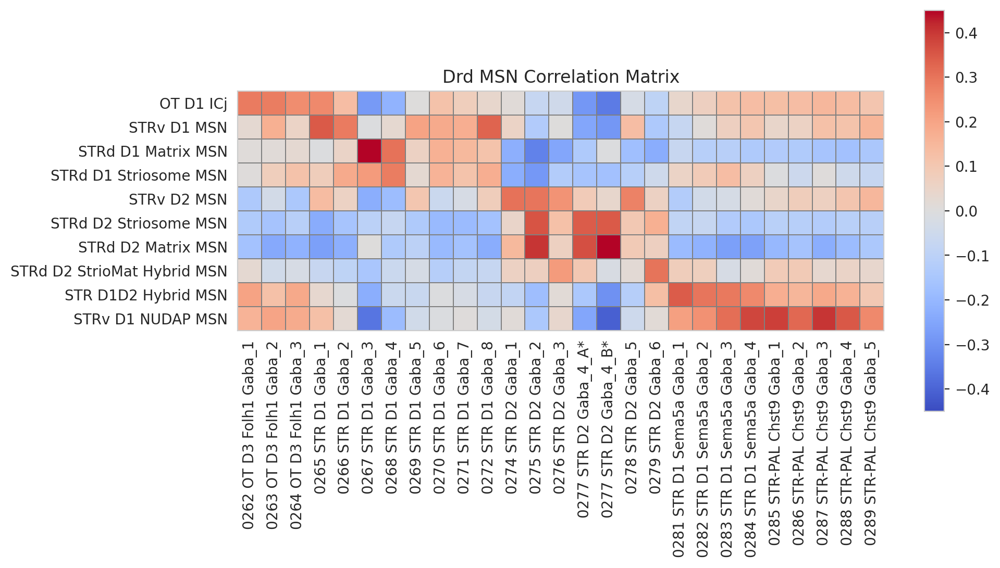

In [37]:
fig, ax = plt.subplots(figsize=(10,5), dpi=200)

# plot
im = ax.imshow(drd_corr_mat[drd_row_orders, :], cmap='coolwarm', vmin=-0.45, vmax=0.45)
# im = ax.imshow(drd_corr_mat, cmap='coolwarm', vmin=-0.3, vmax=0.3)

# colorbar
plt.colorbar(im)

# ticks and tick labels
ax.set_xticks(range(drd_corr_mat.shape[1]))
ax.set_xticklabels(wmb_drd_stype_expr.index, rotation=90)

ax.set_yticks(range(drd_corr_mat.shape[0]))
ax.set_yticklabels(hmba_drd_group_expr.index[drd_row_orders])
# ax.set_yticklabels(hmba_drd_group_expr.index)

# cancel ticklines
ax.tick_params(axis='both', grid_alpha=0)

# column border lines
num_cols = drd_corr_mat.shape[1]
col_edges = np.arange(-0.5, num_cols, 1)
for x in col_edges:
    # antializased: remove surrounding extra white areas
    ax.axvline(x, color="gray", linewidth=0.1, antialiased=False)

# row border lines
num_rows = drd_corr_mat.shape[0]
row_edges = np.arange(-0.5, num_rows, 1)
for y in row_edges:
    # antializased: remove surrounding extra white areas
    ax.axhline(y, color="gray", linewidth=0.1, antialiased=False)

plt.title("Drd MSN Correlation Matrix")
# plt.tight_layout()
plt.show()

### Plot marker expression

In [38]:
# group_list_adata = [
#     'STRd D1 Matrix MSN', 'STRd D1 Striosome MSN',
#     'STRd D2 Matrix MSN', 'STRd D2 Striosome MSN', 'STRd D2 StrioMat Hybrid MSN',
#     'STRv D1 MSN', 'STRv D2 MSN', 'STRv D1 NUDAP MSN',
#     'STR D1D2 Hybrid MSN', 'OT D1 ICj'
# ]
#
# group_list_marker_df = [
#     'STRd D1 Matrix', 'STRd D1 Striosome',
#     'STRd D2 Matrix', 'STRd D2 Striosome', 'STRd D2 StrioMat Hybrid',
#     'STRv D1 Shell', 'STRv D2 Shell', 'STRv D1 NUDAP',
#     'STRd D1D2 Hybrid', 'OT D1 ICj'
# ]

In [49]:
def plot_hs_markers_in_mm(adata_group_name, marker_group_name, fig_width=8, fig_height=8, dpi=125, font_size=18, saving_dir='/mnt/Y/Lab/Stereo_seq_data/RL_BG_data/analysis_results/panels/cell_type_mapping', saving_name=None):
    # select human markers
    hs_markers = group_markers.loc[marker_group_name].iloc[0]
    # select mapped markers
    hs_markers = hmba_group_expr.columns[hmba_group_expr.columns.isin(hs_markers)]

    # filter human expression matrix
    # (n_genes,)
    hmba_expr = hmba_drd_group_expr.loc[adata_group_name, hs_markers].copy()
    # sort markers according to expressions
    hmba_expr = hmba_expr.sort_values(ascending=False)
    hs_markers = hmba_expr.index

    # convert human markers to mouse markers
    mm_markers = []
    for m in hs_markers:
        mm_markers.append(hs_mm_homologs['Symbol_mouse'][hs_mm_homologs['Symbol_human'] == m].item())

    # filter mouse expression matrix
    # (n_stypes, n_genes)
    wmb_expr = wmb_drd_stype_expr.loc[:, mm_markers].copy()

    # calculate coorelations between mouse and human
    coor_ser = pd.Series(0, index=wmb_expr.index, dtype=np.float64)
    for i in range(len(wmb_expr)):
        coor = np.corrcoef(wmb_expr.iloc[i], hmba_expr)[0, 1]
        coor_ser.iloc[i] = coor
    wmb_expr.insert(loc=0, column='Coorelation', value=coor_ser)

    # sort wmb_expre according to coorlation
    wmb_expr = wmb_expr.sort_values(by='Coorelation', axis=0, ascending=False).copy()

    # add human coorelation column (should be always 1)
    new_item = pd.Series(1, index=['Coorrelation'])
    hmba_expr = pd.concat([new_item, hmba_expr])

    # insert human expr to mouse df
    insert_rows = pd.DataFrame(
        0.0,
        index=[adata_group_name, 'Separator Line'],
        columns=hmba_expr.index,
    )
    insert_rows.loc[adata_group_name] = hmba_expr

    # unify the column labels
    insert_rows.columns = wmb_expr.columns

    # concat human expr with mouse expr
    wmb_expr = pd.concat([insert_rows, wmb_expr]).copy()

    # check mean expr
    print(wmb_expr['Coorelation'])

    # plot
    fig, ax = plt.subplots(figsize=(fig_width, fig_height), dpi=dpi)
    im = ax.imshow(wmb_expr, cmap='coolwarm', vmin=-1, vmax=1)

    # colorbar
    cbar = plt.colorbar(im, fraction=0.05, shrink=0.5, pad=0.01)

    helv = fm.FontProperties(family='sans-serif', style='oblique', size=18, weight=500)
    for tick in cbar.ax.get_yticklabels():
        tick.set_fontproperties(helv)

    # adjust first tick's (coorelation) postion
    positions = list(range(wmb_expr.shape[1]))
    positions[0] -= 0.5

    # ticks and tick labels
    # ax.set_xticks(positions, labels=wmb_expr.columns, fontsize=font_size, rotation=65)
    ax.set_xticks(positions, labels=hmba_expr.index, fontsize=font_size, rotation=65)
    ax.set_yticks(range(wmb_expr.shape[0]), labels=wmb_expr.index, fontsize=font_size)

    # cancel ticklines
    ax.tick_params(axis='both', grid_alpha=0)

    # column border lines
    # num_cols = wmb_expr.shape[1]
    num_cols = len(hmba_expr)
    col_edges = np.arange(-0.5, num_cols, 1)
    for x in col_edges:
        ax.axvline(x, color="white", linewidth=0.5)

    # row border lines
    num_rows = wmb_expr.shape[0]
    row_edges = np.arange(-0.5, num_rows, 1)
    for y in row_edges:
        ax.axhline(y, color="white", linewidth=0.5)

    # plt.title("Human [{}] Markers' Expresion in Mouse Cells".format(adata_group_name), fontsize='xx-large')
    plt.tight_layout()
    if saving_name:
        plt.savefig(join(saving_dir, saving_name), format='tif')
    plt.show()

STRd D1 Striosome MSN        1.000000
Separator Line               0.000000
0266 STR D1 Gaba_2           0.555062
0268 STR D1 Gaba_4           0.554369
0272 STR D1 Gaba_8           0.450399
0267 STR D1 Gaba_3           0.315317
0270 STR D1 Gaba_6           0.271103
0269 STR D1 Gaba_5           0.261442
0271 STR D1 Gaba_7           0.256192
0265 STR D1 Gaba_1           0.245861
0263 OT D3 Folh1 Gaba_2      0.136864
0262 OT D3 Folh1 Gaba_1      0.131026
0264 OT D3 Folh1 Gaba_3      0.101163
0279 STR D2 Gaba_6           0.079814
0281 STR D1 Sema5a Gaba_1    0.004187
0284 STR D1 Sema5a Gaba_4   -0.011832
0282 STR D1 Sema5a Gaba_2   -0.050591
0283 STR D1 Sema5a Gaba_3   -0.090076
0287 STR-PAL Chst9 Gaba_3   -0.090851
0276 STR D2 Gaba_3          -0.135484
0289 STR-PAL Chst9 Gaba_5   -0.173241
0285 STR-PAL Chst9 Gaba_1   -0.175170
0288 STR-PAL Chst9 Gaba_4   -0.194901
0278 STR D2 Gaba_5          -0.208711
0286 STR-PAL Chst9 Gaba_2   -0.229963
0277 STR D2 Gaba_4_A*       -0.244930
0277 STR D2 

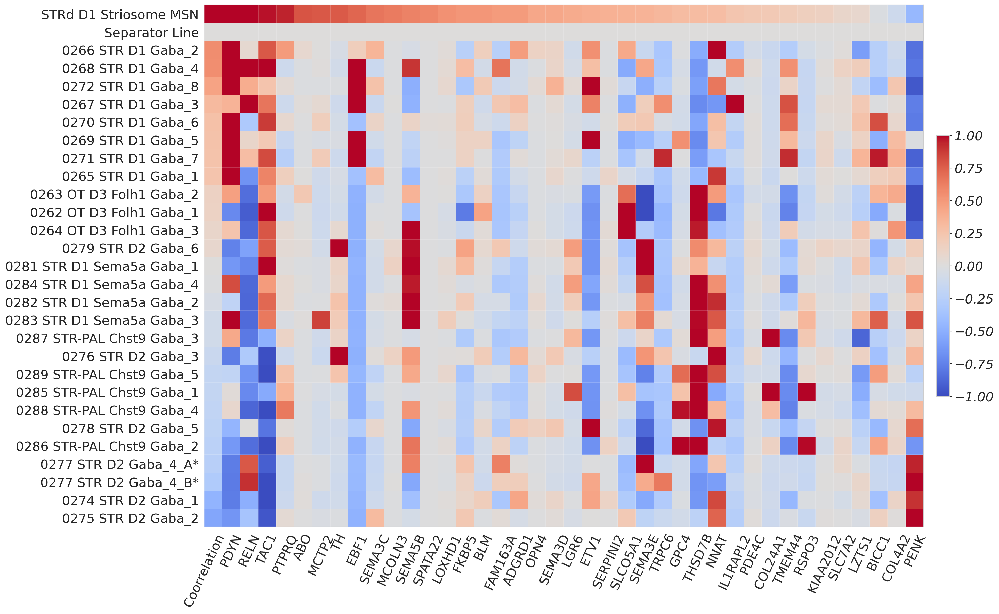

In [50]:
plot_hs_markers_in_mm('STRd D1 Striosome MSN', 'STRd D1 Striosome', fig_width=25, fig_height=12, dpi=200, saving_name='mapping_matrix_STRd_D1_Striosome_MSN.tif')

STRd D1 Matrix MSN           1.000000
Separator Line               0.000000
0267 STR D1 Gaba_3           0.669400
0268 STR D1 Gaba_4           0.417356
0271 STR D1 Gaba_7           0.394402
0269 STR D1 Gaba_5           0.250141
0272 STR D1 Gaba_8           0.235353
0277 STR D2 Gaba_4_B*        0.067430
0262 OT D3 Folh1 Gaba_1      0.042844
0266 STR D1 Gaba_2           0.041802
0281 STR D1 Sema5a Gaba_1   -0.003922
0270 STR D1 Gaba_6          -0.009118
0277 STR D2 Gaba_4_A*       -0.089058
0263 OT D3 Folh1 Gaba_2     -0.095058
0265 STR D1 Gaba_1          -0.126540
0264 OT D3 Folh1 Gaba_3     -0.134024
0282 STR D1 Sema5a Gaba_2   -0.187357
0283 STR D1 Sema5a Gaba_3   -0.231226
0278 STR D2 Gaba_5          -0.241840
0279 STR D2 Gaba_6          -0.271634
0284 STR D1 Sema5a Gaba_4   -0.311133
0276 STR D2 Gaba_3          -0.338416
0274 STR D2 Gaba_1          -0.399163
0285 STR-PAL Chst9 Gaba_1   -0.422735
0287 STR-PAL Chst9 Gaba_3   -0.426566
0275 STR D2 Gaba_2          -0.433462
0289 STR-PAL

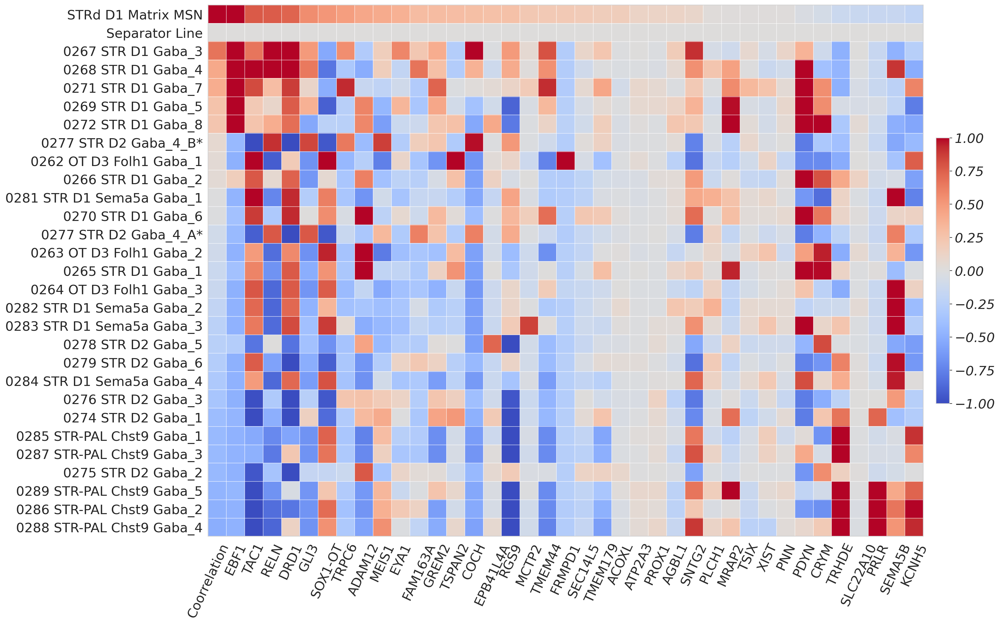

In [51]:
plot_hs_markers_in_mm('STRd D1 Matrix MSN', 'STRd D1 Matrix', fig_width=25, fig_height=12, dpi=200, saving_name='mapping_matrix_STRd_D1_Matrix_MSN.tif')

STR D1D2 Hybrid MSN          1.000000
Separator Line               0.000000
0262 OT D3 Folh1 Gaba_1      0.490947
0281 STR D1 Sema5a Gaba_1    0.338249
0264 OT D3 Folh1 Gaba_3      0.327056
0285 STR-PAL Chst9 Gaba_1    0.322177
0287 STR-PAL Chst9 Gaba_3    0.311450
0286 STR-PAL Chst9 Gaba_2    0.290894
0282 STR D1 Sema5a Gaba_2    0.288723
0263 OT D3 Folh1 Gaba_2      0.282823
0288 STR-PAL Chst9 Gaba_4    0.274099
0284 STR D1 Sema5a Gaba_4    0.263435
0289 STR-PAL Chst9 Gaba_5    0.239686
0283 STR D1 Sema5a Gaba_3    0.226448
0279 STR D2 Gaba_6           0.178242
0265 STR D1 Gaba_1           0.014085
0276 STR D2 Gaba_3          -0.034037
0266 STR D1 Gaba_2          -0.039240
0272 STR D1 Gaba_8          -0.156638
0270 STR D1 Gaba_6          -0.156643
0274 STR D2 Gaba_1          -0.178384
0278 STR D2 Gaba_5          -0.218122
0271 STR D1 Gaba_7          -0.228801
0277 STR D2 Gaba_4_A*       -0.231887
0268 STR D1 Gaba_4          -0.232876
0269 STR D1 Gaba_5          -0.270846
0275 STR D2 

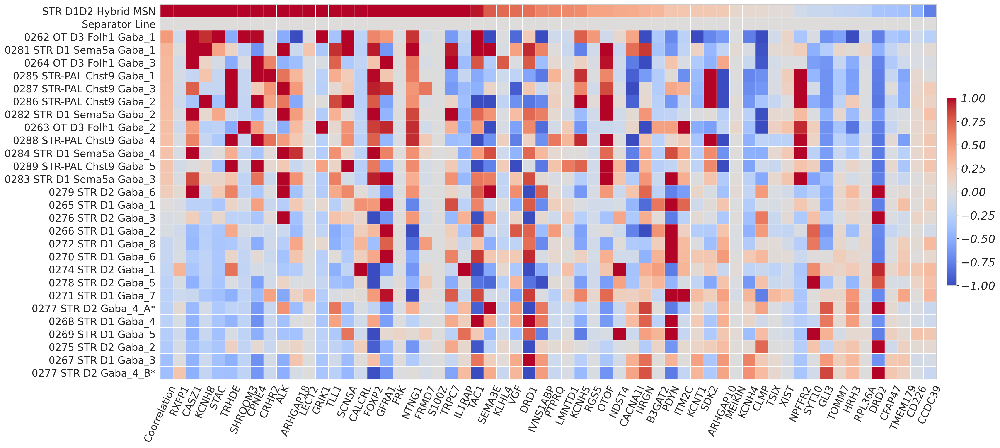

In [52]:
plot_hs_markers_in_mm('STR D1D2 Hybrid MSN', 'STRd D1D2 Hybrid', fig_width=25, fig_height=10, dpi=200, font_size=16, saving_name='mapping_matrix_STR_D1D2_Hybrid_MSN.tif')

STRd D2 Striosome MSN        1.000000
Separator Line               0.000000
0275 STR D2 Gaba_2           0.594476
0277 STR D2 Gaba_4_A*        0.521320
0279 STR D2 Gaba_6           0.482204
0277 STR D2 Gaba_4_B*        0.437818
0276 STR D2 Gaba_3           0.297663
0274 STR D2 Gaba_1           0.272201
0278 STR D2 Gaba_5           0.203199
0288 STR-PAL Chst9 Gaba_4    0.040214
0285 STR-PAL Chst9 Gaba_1    0.021999
0287 STR-PAL Chst9 Gaba_3   -0.011027
0286 STR-PAL Chst9 Gaba_2   -0.065792
0262 OT D3 Folh1 Gaba_1     -0.088354
0282 STR D1 Sema5a Gaba_2   -0.090773
0289 STR-PAL Chst9 Gaba_5   -0.099284
0281 STR D1 Sema5a Gaba_1   -0.134045
0284 STR D1 Sema5a Gaba_4   -0.152481
0264 OT D3 Folh1 Gaba_3     -0.161153
0283 STR D1 Sema5a Gaba_3   -0.183728
0263 OT D3 Folh1 Gaba_2     -0.275146
0268 STR D1 Gaba_4          -0.446401
0266 STR D1 Gaba_2          -0.451775
0272 STR D1 Gaba_8          -0.496056
0269 STR D1 Gaba_5          -0.528964
0265 STR D1 Gaba_1          -0.531044
0270 STR D1 

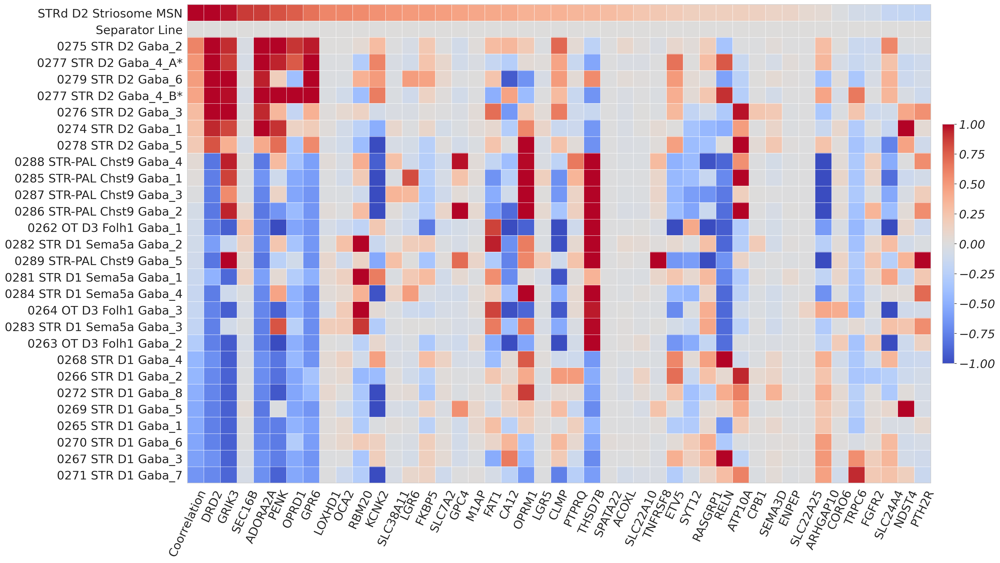

In [53]:
plot_hs_markers_in_mm('STRd D2 Striosome MSN', 'STRd D2 Striosome', fig_width=25, fig_height=12, dpi=200, saving_name='mapping_matrix_STRd_D2_Striosome_MSN.tif')

STRd D2 Matrix MSN           1.000000
Separator Line               0.000000
0277 STR D2 Gaba_4_B*        0.636194
0277 STR D2 Gaba_4_A*        0.617251
0275 STR D2 Gaba_2           0.480880
0279 STR D2 Gaba_6           0.371921
0276 STR D2 Gaba_3           0.164233
0274 STR D2 Gaba_1           0.095063
0278 STR D2 Gaba_5          -0.008042
0262 OT D3 Folh1 Gaba_1     -0.123087
0267 STR D1 Gaba_3          -0.142272
0285 STR-PAL Chst9 Gaba_1   -0.202697
0286 STR-PAL Chst9 Gaba_2   -0.216885
0289 STR-PAL Chst9 Gaba_5   -0.222420
0281 STR D1 Sema5a Gaba_1   -0.230278
0288 STR-PAL Chst9 Gaba_4   -0.245815
0287 STR-PAL Chst9 Gaba_3   -0.294943
0268 STR D1 Gaba_4          -0.301658
0269 STR D1 Gaba_5          -0.378547
0284 STR D1 Sema5a Gaba_4   -0.383667
0283 STR D1 Sema5a Gaba_3   -0.388179
0264 OT D3 Folh1 Gaba_3     -0.392885
0263 OT D3 Folh1 Gaba_2     -0.422812
0282 STR D1 Sema5a Gaba_2   -0.429319
0270 STR D1 Gaba_6          -0.470700
0271 STR D1 Gaba_7          -0.482727
0266 STR D1 

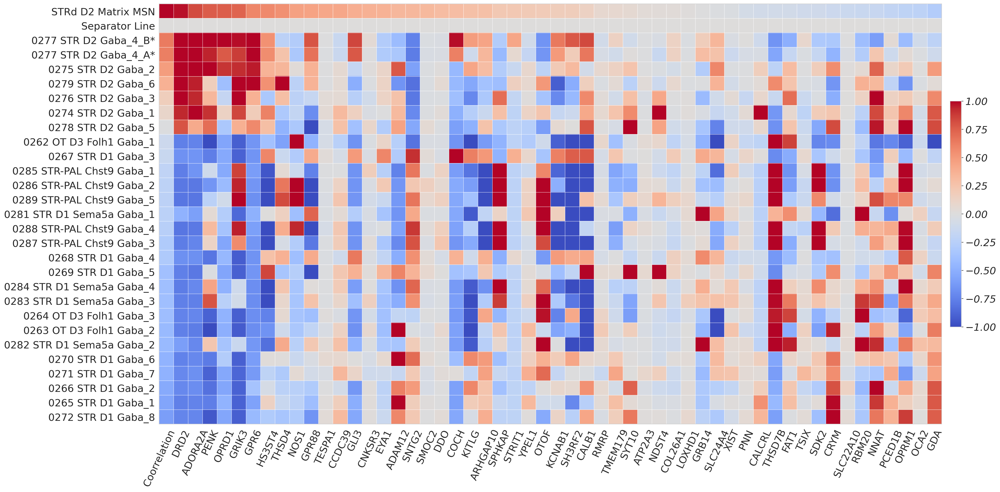

In [54]:
plot_hs_markers_in_mm('STRd D2 Matrix MSN', 'STRd D2 Matrix', fig_width=25, fig_height=13, dpi=200, saving_name='mapping_matrix_STRd_D2_Matrix_MSN.tif')

STRd D2 StrioMat Hybrid MSN    1.000000
Separator Line                 0.000000
0289 STR-PAL Chst9 Gaba_5      0.567145
0267 STR D1 Gaba_3             0.455264
0286 STR-PAL Chst9 Gaba_2      0.440300
0288 STR-PAL Chst9 Gaba_4      0.396917
0269 STR D1 Gaba_5             0.334496
0271 STR D1 Gaba_7             0.301542
0274 STR D2 Gaba_1             0.288345
0268 STR D1 Gaba_4             0.250338
0276 STR D2 Gaba_3             0.249906
0272 STR D1 Gaba_8             0.205613
0285 STR-PAL Chst9 Gaba_1      0.200822
0282 STR D1 Sema5a Gaba_2      0.140567
0263 OT D3 Folh1 Gaba_2        0.063406
0279 STR D2 Gaba_6             0.050136
0287 STR-PAL Chst9 Gaba_3      0.026332
0262 OT D3 Folh1 Gaba_1       -0.009145
0284 STR D1 Sema5a Gaba_4     -0.060774
0277 STR D2 Gaba_4_A*         -0.082452
0277 STR D2 Gaba_4_B*         -0.086160
0278 STR D2 Gaba_5            -0.125082
0265 STR D1 Gaba_1            -0.126694
0281 STR D1 Sema5a Gaba_1     -0.160900
0283 STR D1 Sema5a Gaba_3     -0.192711


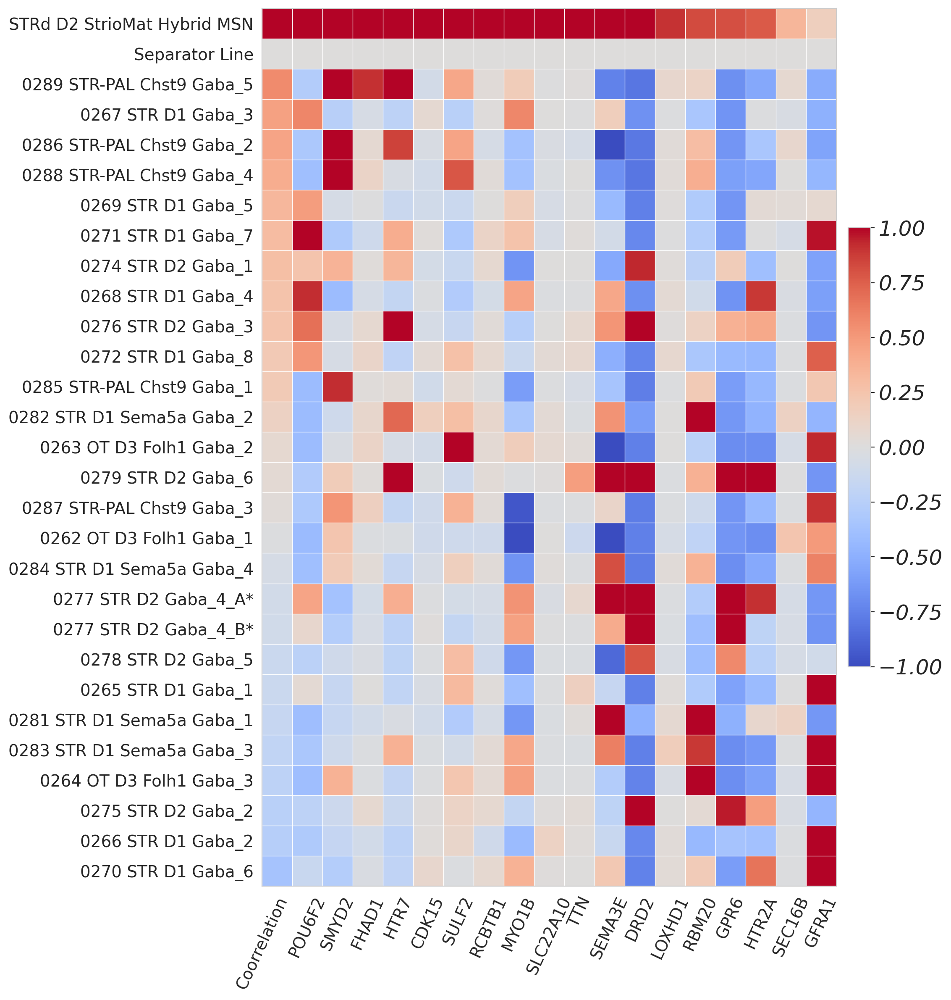

In [55]:
plot_hs_markers_in_mm('STRd D2 StrioMat Hybrid MSN', 'STRd D2 StrioMat Hybrid', fig_width=15, fig_height=12, dpi=200, font_size=14, saving_name='mapping_matrix_STRd_D2_StrioMat_Hybrid_MSN.tif')

STRv D1 MSN                  1.000000
Separator Line               0.000000
0272 STR D1 Gaba_8           0.375532
0269 STR D1 Gaba_5           0.336638
0265 STR D1 Gaba_1           0.318539
0266 STR D1 Gaba_2           0.287914
0278 STR D2 Gaba_5           0.201821
0268 STR D1 Gaba_4           0.174433
0289 STR-PAL Chst9 Gaba_5    0.126021
0270 STR D1 Gaba_6           0.113140
0288 STR-PAL Chst9 Gaba_4    0.098961
0284 STR D1 Sema5a Gaba_4    0.087780
0267 STR D1 Gaba_3           0.078155
0287 STR-PAL Chst9 Gaba_3    0.077718
0271 STR D1 Gaba_7           0.076914
0274 STR D2 Gaba_1           0.026531
0276 STR D2 Gaba_3           0.025657
0263 OT D3 Folh1 Gaba_2      0.011514
0277 STR D2 Gaba_4_A*        0.005295
0275 STR D2 Gaba_2          -0.030180
0282 STR D1 Sema5a Gaba_2   -0.042939
0286 STR-PAL Chst9 Gaba_2   -0.050193
0285 STR-PAL Chst9 Gaba_1   -0.066655
0279 STR D2 Gaba_6          -0.068635
0281 STR D1 Sema5a Gaba_1   -0.078915
0283 STR D1 Sema5a Gaba_3   -0.084570
0277 STR D2 

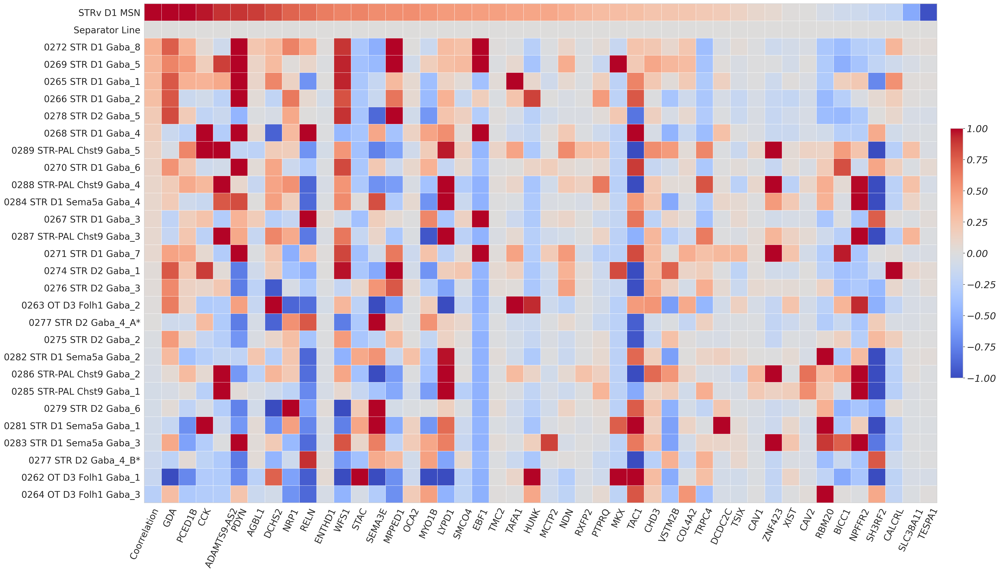

In [56]:
plot_hs_markers_in_mm('STRv D1 MSN', 'STRv D1 Shell', fig_width=35, fig_height=15, dpi=200, saving_name='mapping_matrix_STRv_D1_MSN.tif', font_size=17)

STRv D2 MSN                  1.000000
Separator Line               0.000000
0275 STR D2 Gaba_2           0.577918
0278 STR D2 Gaba_5           0.344520
0277 STR D2 Gaba_4_A*        0.309449
0277 STR D2 Gaba_4_B*        0.308119
0274 STR D2 Gaba_1           0.209378
0269 STR D1 Gaba_5           0.193950
0270 STR D1 Gaba_6           0.137449
0276 STR D2 Gaba_3           0.129562
0272 STR D1 Gaba_8           0.125000
0266 STR D1 Gaba_2           0.107369
0268 STR D1 Gaba_4           0.062358
0271 STR D1 Gaba_7           0.045842
0283 STR D1 Sema5a Gaba_3    0.026684
0265 STR D1 Gaba_1           0.026055
0267 STR D1 Gaba_3           0.013872
0279 STR D2 Gaba_6          -0.008437
0282 STR D1 Sema5a Gaba_2   -0.017705
0284 STR D1 Sema5a Gaba_4   -0.103195
0281 STR D1 Sema5a Gaba_1   -0.147460
0263 OT D3 Folh1 Gaba_2     -0.188716
0264 OT D3 Folh1 Gaba_3     -0.256784
0286 STR-PAL Chst9 Gaba_2   -0.271513
0289 STR-PAL Chst9 Gaba_5   -0.271738
0288 STR-PAL Chst9 Gaba_4   -0.319875
0287 STR-PAL

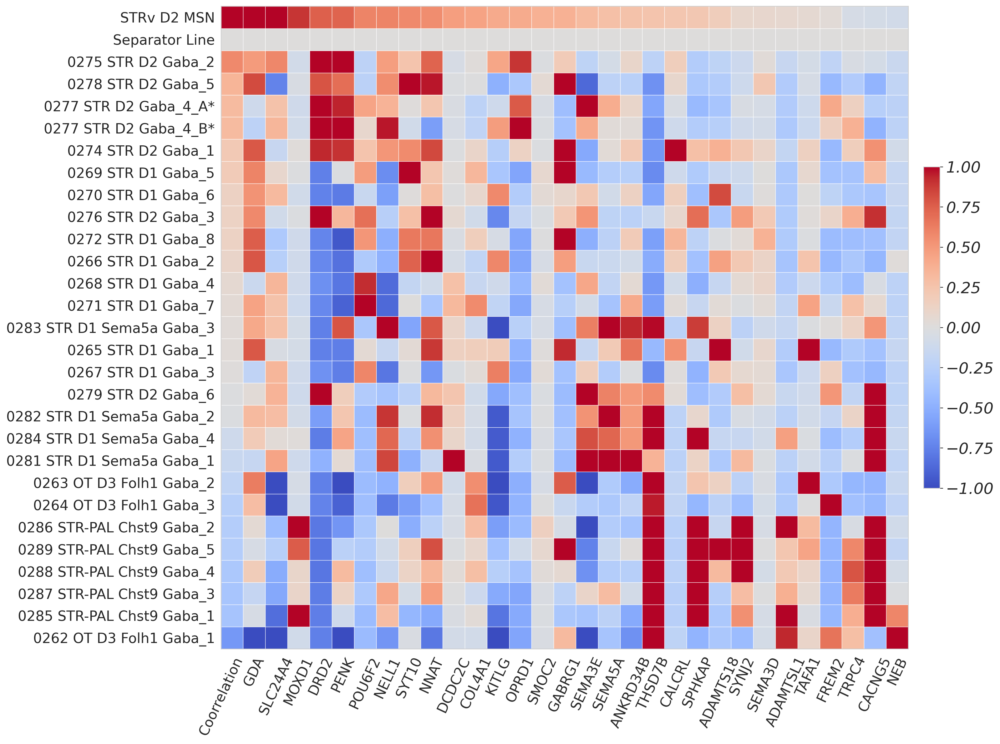

In [57]:
plot_hs_markers_in_mm('STRv D2 MSN', 'STRv D2 Shell', fig_width=25, fig_height=12, dpi=200, saving_name='mapping_matrix_STRv_D2_MSN.tif', font_size=16)

STRv D1 NUDAP MSN            1.000000
Separator Line               0.000000
0285 STR-PAL Chst9 Gaba_1    0.383075
0287 STR-PAL Chst9 Gaba_3    0.372491
0284 STR D1 Sema5a Gaba_4    0.288536
0288 STR-PAL Chst9 Gaba_4    0.272153
0286 STR-PAL Chst9 Gaba_2    0.268793
0281 STR D1 Sema5a Gaba_1    0.197776
0263 OT D3 Folh1 Gaba_2      0.155077
0276 STR D2 Gaba_3           0.141071
0282 STR D1 Sema5a Gaba_2    0.129584
0264 OT D3 Folh1 Gaba_3      0.129232
0279 STR D2 Gaba_6           0.126353
0289 STR-PAL Chst9 Gaba_5    0.104369
0265 STR D1 Gaba_1           0.042791
0283 STR D1 Sema5a Gaba_3    0.031235
0274 STR D2 Gaba_1           0.000782
0262 OT D3 Folh1 Gaba_1     -0.008935
0272 STR D1 Gaba_8          -0.025459
0266 STR D1 Gaba_2          -0.057126
0278 STR D2 Gaba_5          -0.066312
0275 STR D2 Gaba_2          -0.093225
0270 STR D1 Gaba_6          -0.108675
0277 STR D2 Gaba_4_A*       -0.118206
0268 STR D1 Gaba_4          -0.121503
0271 STR D1 Gaba_7          -0.154348
0277 STR D2 

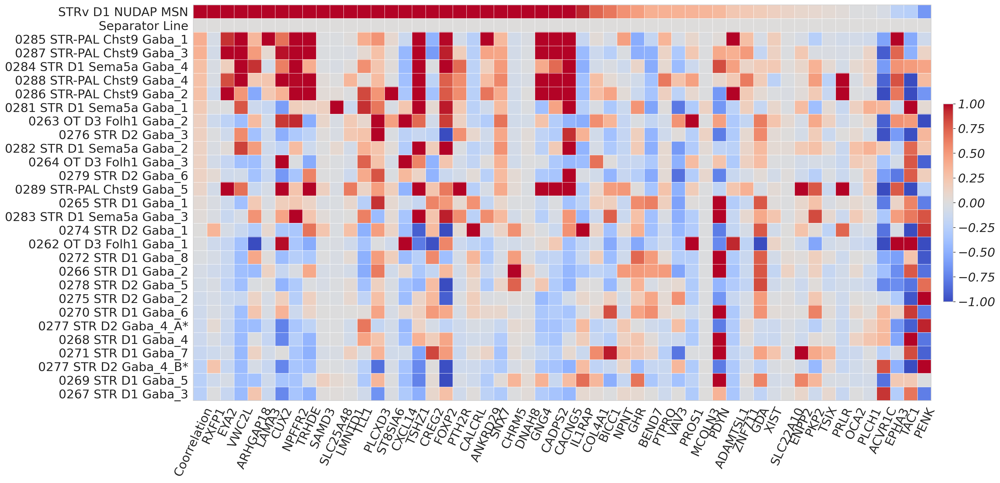

In [58]:
plot_hs_markers_in_mm('STRv D1 NUDAP MSN', 'STRv D1 NUDAP', fig_width=25, fig_height=10, dpi=200, saving_name='mapping_matrix_STRv_D1_NUDAP_MSN.tif')

OT D1 ICj                    1.000000
Separator Line               0.000000
0265 STR D1 Gaba_1           0.376878
0263 OT D3 Folh1 Gaba_2      0.356000
0264 OT D3 Folh1 Gaba_3      0.319671
0266 STR D1 Gaba_2           0.287065
0270 STR D1 Gaba_6           0.271746
0275 STR D2 Gaba_2           0.247436
0262 OT D3 Folh1 Gaba_1      0.222807
0281 STR D1 Sema5a Gaba_1    0.192425
0278 STR D2 Gaba_5           0.101230
0282 STR D1 Sema5a Gaba_2    0.091732
0274 STR D2 Gaba_1           0.088003
0272 STR D1 Gaba_8          -0.008794
0271 STR D1 Gaba_7          -0.051524
0283 STR D1 Sema5a Gaba_3   -0.094276
0279 STR D2 Gaba_6          -0.114643
0284 STR D1 Sema5a Gaba_4   -0.116838
0269 STR D1 Gaba_5          -0.143865
0286 STR-PAL Chst9 Gaba_2   -0.144989
0287 STR-PAL Chst9 Gaba_3   -0.174525
0276 STR D2 Gaba_3          -0.223989
0277 STR D2 Gaba_4_B*       -0.241098
0285 STR-PAL Chst9 Gaba_1   -0.268250
0288 STR-PAL Chst9 Gaba_4   -0.295804
0277 STR D2 Gaba_4_A*       -0.346199
0289 STR-PAL

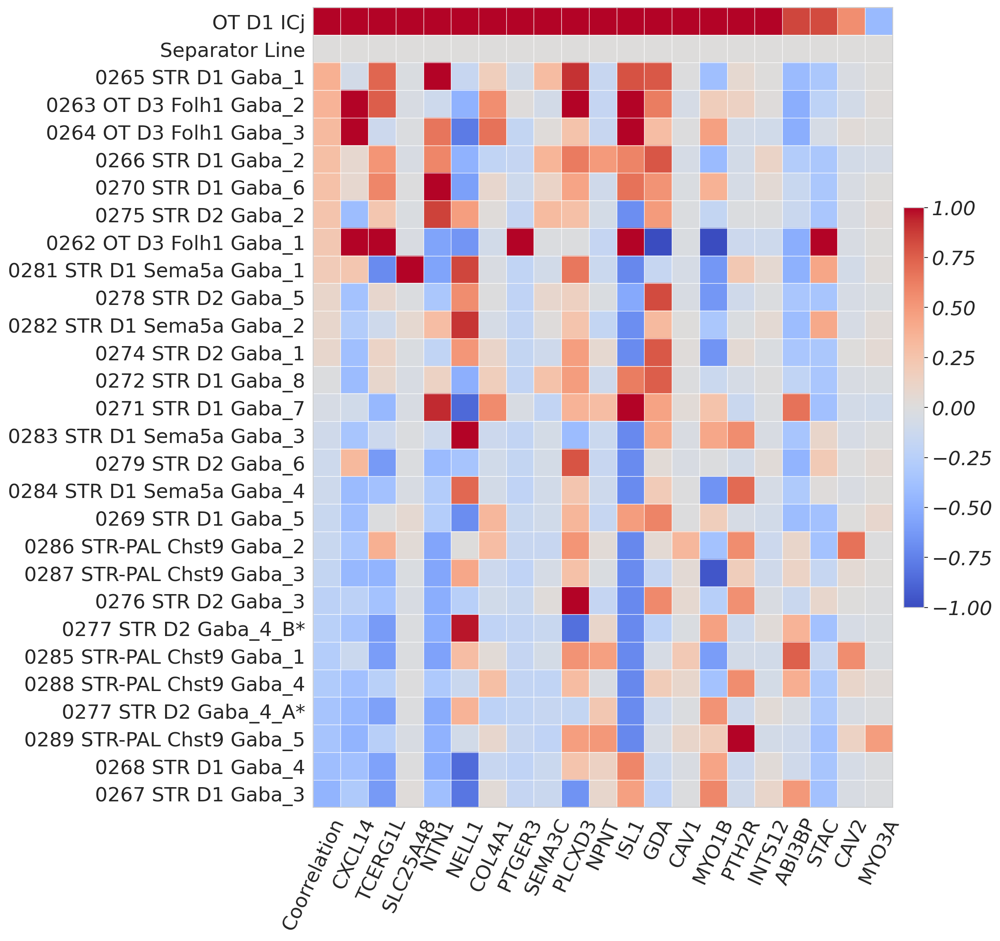

In [59]:
plot_hs_markers_in_mm('OT D1 ICj', 'OT D1-ICj', fig_width=15, fig_height=12, dpi=200, saving_name='mapping_matrix_OT_D1_ICj.tif')